In [295]:
import numpy as np
import sympy as sp
import control
from scipy.linalg import solve_continuous_lyapunov
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.interpolate import interp1d
from sympy.parsing.sympy_parser import parse_expr

In [296]:
def animate_inverted_pendulum(x_pos, theta, time, Len=0.1, r=0.06, margin=0.2, interval=30):
    fig, ax = plt.subplots(figsize=(4, 3)) 
    ax.set_aspect('equal')

    ax.set_xlim(-0.5, 0.5)
    ax.set_ylim(-0.3, 0.3)

    rod_line, = ax.plot([], [], 'b-', lw=2)
    wheel_dot, = ax.plot([], [], 'ko', ms=8)
    time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

    def init():
        rod_line.set_data([], [])
        wheel_dot.set_data([], [])
        time_text.set_text('')
        return rod_line, wheel_dot, time_text

    def update(i):
        x = x_pos[i]
        angle = theta[i]
        x0, y0 = x, r
        x1 = x + Len * np.sin(angle)
        y1 = y0 + Len * np.cos(angle)

        rod_line.set_data([x0, x1], [y0, y1])
        wheel_dot.set_data([x], [r])
        time_text.set_text(f"t = {time[i]:.2f}s")
        return rod_line, wheel_dot, time_text

    ani = FuncAnimation(fig, update, frames=len(time), init_func=init, interval=interval, blit=True)
    return HTML(ani.to_jshtml())

# LQR Control Solver and Simulation

## Initialization

### Define Symbols

In [297]:
# Parameters
r, Mb, rb, Ib, Mw, Iw, g, tau = sp.symbols('r M_b r_b I_b M_w I_w g tau')

### Define State Space Functions

In [298]:
with open('../dynamics/output/A.txt', 'r') as f:
    A = parse_expr(f.read())

with open('../dynamics/output/B.txt', 'r') as f:
    B = parse_expr(f.read())

In [299]:
print(A)
print(B)

Matrix([[0, 1, 0, 0], [0, 0, -M_b**2*g*r**2*r_b**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2), 0], [0, 0, 0, 1], [0, 0, I_w*M_b*g*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b**2*g*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*M_w*g*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2), 0]])
Matrix([[0], [-I_b*r/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) - M_b*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) - M_b*r*r_b**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2)], [0], [I_w/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*r**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*r*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w

In [300]:
# A = sp.Matrix([[0, 1, 0, 0], [-Lb**2*Mb**2*g*r/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2), 0, -Lb**2*Mb**2*g*r**2/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2), 0], [0, 0, 0, 1], [(2*Iw*Lb*Mb*g + 2*Lb**2*Mb**2*g*r + 2*Lb*Mb**2*g*r**2 + 2*Lb*Mb*Mw*g*r**2)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2)), 0, (2*Iw*Lb*Mb*g*r + 2*Lb**2*Mb**2*g*r**2 + 2*Lb*Mb**2*g*r**3 + 2*Lb*Mb*Mw*g*r**3)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2)), 0]])
# B = sp.Matrix([[0], [(-Ib*r - Lb**2*Mb*r - Lb*Mb*r**2)/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2)], [0], [(2*Ib*r + 2*Iw*r + 2*Lb**2*Mb*r + 4*Lb*Mb*r**2 + 2*Mb*r**3 + 2*Mw*r**3)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2))]])
C = sp.Matrix([[0, 0, 0, 0]])
D = sp.Matrix([[0]])

### Define System Parameters

In [301]:
subs_dict = {
    Mb: 0.366,    # Body Mass
    rb: 0.09,    # Pendulum center of mass
    Ib: 0.0082,   # Body Inertia
    Mw: 0.409 * 2,    # Wheel mass
    Iw: 0.00029,   # Wheel inertia
    r: 0.06,    # Wheel radius
    g: 9.81     # Gravity
}

### Subsitute to Numpy Values

In [302]:
A_num = np.array(A.subs(subs_dict).evalf().tolist()).astype(np.float64)
B_num = np.array(B.subs(subs_dict).evalf().tolist()).astype(np.float64)
C_num = np.eye(4)
D_num = np.zeros((4, 1))

sys = control.ss(A_num, B_num, C_num, D_num)

### Initial State

In [303]:
x0 = np.array([0.0, 0.0, 0.2, 0.2])

### No control state response

In [304]:
T = np.linspace(0,10, 200)
T_out, x_out  = control.forced_response(sys, T, U=0*T, X0=x0)

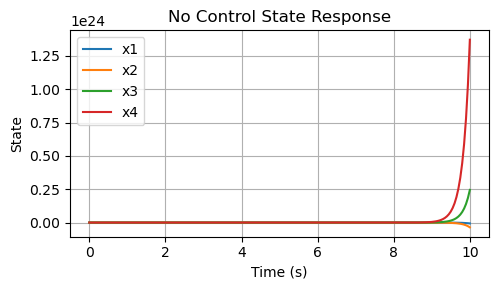

In [305]:
plt.figure(figsize=(5, 3))
for i in range(x_out.shape[0]):
    plt.plot(T_out, x_out[i], label=f'x{i+1}')
plt.xlabel('Time (s)')
plt.ylabel('State')
plt.title('No Control State Response')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Control Calculator

### Controllability

In [306]:
ctrb_matrix = control.ctrb(A_num, B_num)
print("Rank of ctrb:", np.linalg.matrix_rank(ctrb_matrix))

Rank of ctrb: 4


In [307]:
eigvals = np.linalg.eigvals(A_num)
print("All eigenvalues:", eigvals)

All eigenvalues: [ 0.          0.          5.59937438 -5.59937438]


### Calculate K by LQR

In [308]:
Q = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 10, 0],
    [0, 0, 0, 5]
])
R = np.array([[2.5]])
K, S, E = control.lqr(A_num, B_num, Q, R)
print("LQR gain K:", K)

LQR gain K: [[0.63245553 1.47847779 4.41814557 1.61668767]]


### Calculate the new eigen for contolled A

In [309]:
A_cl = A_num - B_num @ K
eigvals_cl = np.linalg.eigvals(A_cl)
print("Closed-loop eigenvalues:", eigvals_cl)
sys_cl = control.ss(A_cl, B_num, C_num, D_num)

Closed-loop eigenvalues: [-197.22641469+0.j           -0.80091187+0.62316983j
   -0.80091187-0.62316983j   -1.28677224+0.j        ]


### Gramian

In [310]:
Wc = solve_continuous_lyapunov(A_cl, -B_num @ B_num.T)
print("Controllability Gramian (via SciPy):\n", Wc)


Controllability Gramian (via SciPy):
 [[ 6.54199699e-01  1.68285866e-15 -1.09266813e-01 -9.69866344e-15]
 [-5.87747546e-15  1.07034712e+00  7.71024901e-16 -6.17604493e+00]
 [-1.09266813e-01  1.76954953e-15  9.99256439e-02 -1.32673824e-15]
 [-1.03711378e-14 -6.17604493e+00  5.44985652e-16  4.86831994e+01]]


## Simulation

#### disturbance

In [311]:
U = np.zeros_like(T)
U += np.exp(-((T - 5.0)/0.3)**2) * 0.5
U += np.exp(-((T - 8.0)/0.2)**2) * (-0.15)

### LQR Response

In [312]:
T = np.linspace(0,10, 200)
T_out, x_out  = control.forced_response(sys_cl, T, U=U, X0=x0)

#### measurement noise

In [313]:
x_out_noisy = x_out + 0.0002 * np.random.randn(*x_out.shape)

In [314]:
tau = (-K @ x_out_noisy).flatten()

#### Graphics

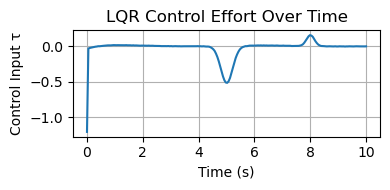

In [315]:
plt.figure(figsize=(4, 2))
plt.plot(T_out, tau)
plt.xlabel("Time (s)")
plt.ylabel("Control Input τ")
plt.title("LQR Control Effort Over Time")
plt.grid(True)
plt.tight_layout()
plt.show()

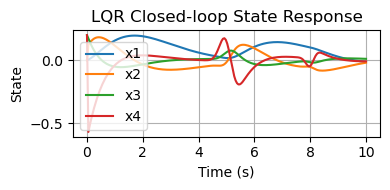

In [316]:
plt.figure(figsize=(4, 2))
for i in range(x_out.shape[0]):
    plt.plot(T_out, x_out[i], label=f'x{i+1}')
plt.xlabel('Time (s)')
plt.ylabel('State')
plt.title('LQR Closed-loop State Response')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Animation

In [317]:
# animate_inverted_pendulum(x_out_noisy[0], x_out_noisy[2], T_out)

### Reduced Matrix (Ignore X)

In [318]:
A_reduced = np.delete(np.delete(A_num, 0, axis=0), 0, axis=1)  
B_reduced = np.delete(B_num, 0, axis=0)                      
C_reduced = np.delete(C_num, 0, axis=1)
D_reduced = np.zeros((C_reduced.shape[0], B_reduced.shape[1]))


Q_reduced = np.diag([1.0, 1000.0, 100.0])
R = np.array([[0.1]])

K_reduced, S_reduced, E_reduced = control.lqr(A_reduced, B_reduced, Q_reduced, R)
print("Reduced LQR K (no x):", K_reduced)

Reduced LQR K (no x): [[  3.16227766 103.1896062   32.03041993]]


In [319]:
A_cl_reduced = A_reduced - B_reduced @ K_reduced
eigvals_cl = np.linalg.eigvals(A_cl_reduced)
print("Closed-loop eigenvalues:", eigvals_cl)
sys_cl = control.ss(A_cl_reduced, B_reduced, C_reduced, D_reduced)

Closed-loop eigenvalues: [-4.40059720e+03 -9.39172128e-02 -3.16179009e+00]


In [320]:
x0_reduced = np.array([0.1, 0.01, 0.0])

In [321]:
T = np.linspace(0,10, 200)
T_out_reduced, x_out_reduced  = control.forced_response(sys_cl, T, U=0*T, X0=x0_reduced)

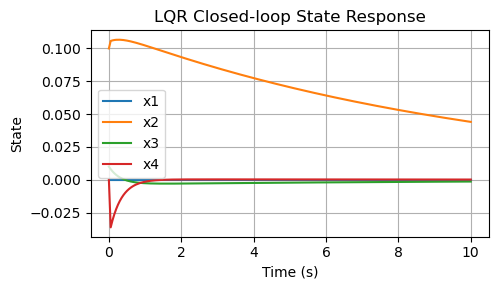

In [322]:
plt.figure(figsize=(5, 3))
for i in range(x_out.shape[0]):
    plt.plot(T_out_reduced, x_out_reduced[i], label=f'x{i+1}')
plt.xlabel('Time (s)')
plt.ylabel('State')
plt.title('LQR Closed-loop State Response')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


dx = x_out_reduced[0, :]           # shape: (N,)
theta = x_out_reduced[1, :]        # shape: (N,)
time = T_out_reduced              

dt = time[1] - time[0]
x_pos = np.cumsum(dx) * dt         # position


L = 0.1
r = 0.06

frame_count = len(time)


fig, ax = plt.subplots()
ax.set_aspect('equal')
ax.set_xlim(np.min(x_pos) - 0.2, np.max(x_pos) + 0.2)
ax.set_ylim(-L - r - 0.2, L + r + 0.2)

rod_line, = ax.plot([], [], 'b-', lw=2)
wheel_dot, = ax.plot([], [], 'ko', ms=8)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

def init():
    rod_line.set_data([], [])
    wheel_dot.set_data([], [])
    time_text.set_text('')
    return rod_line, wheel_dot, time_text

def update(i):
    x = x_pos[i]
    angle = theta[i]
    x0, y0 = x, r
    x1 = x + L * np.sin(angle)
    y1 = y0 + L * np.cos(angle)

    rod_line.set_data([x0, x1], [y0, y1])
    wheel_dot.set_data([x], [r])
    time_text.set_text(f"t = {time[i]:.2f}s")
    return rod_line, wheel_dot, time_text

ani = FuncAnimation(
    fig, update,
    frames=frame_count,
    init_func=init,
    interval=dt * 1000,  # interval ms
    blit=True
)

HTML(ani.to_jshtml())

# LQE Design and Simulation

### Observability

In [323]:
A_num = np.array(A.subs(subs_dict).evalf().tolist()).astype(np.float64)
B_num = np.array(B.subs(subs_dict).evalf().tolist()).astype(np.float64)
C_num = np.array([
    [1, 0, 0, 0],   # x from encoder
    [0, 1, 0, 0],   # ẋ
    [0, 0, 0, 0],   # θ
    [0, 0, 0, 1]    # θ̇
])
D_num = np.zeros((4, 1))

sys = control.ss(A_num, B_num, C_num, D_num)

In [324]:
O = control.obsv(sys.A, sys.C) 
print(np.linalg.matrix_rank(O))

4


### Design LQE

In [325]:
Rn = np.diag([1, 1, 1, 1])
G = np.eye(4)
Qn = np.diag([1, 1, 1, 1])
L, P, E = control.lqe(sys.A, G, sys.C, Qn, Rn)

In [326]:
print(E)

[-1.09882194+0.45503792j -1.09882194-0.45503792j -6.17249939+2.49942101j
 -6.17249939-2.49942101j]


In [327]:
# desired_observer_poles = np.array([-30, -31, -32, -33]) 
# L = control.place(sys.A.T, sys.C.T, desired_observer_poles).T

In [328]:
print(L)

[[ 1.28727066e+00  4.14751063e-01  0.00000000e+00 -2.04430585e-02]
 [ 4.14751063e-01  9.17144371e-01  0.00000000e+00 -2.83475188e-01]
 [-3.59274484e-03 -5.72609057e-02  0.00000000e+00  2.41304928e+00]
 [-2.04430585e-02 -2.83475188e-01  0.00000000e+00  1.23382276e+01]]


# LQG Control

In [329]:
def lqg_closed_loop(t, z, A, B, C, K, L):
    x = z[:4]
    x_hat = z[4:]

    u = -K @ x_hat
    u = np.clip(u, -10, 10) 

    y = C @ x

    D = np.random.normal(loc=0.0, scale=np.array([
        0.001,  # (1 mm)
        0.01,   # (1 cm/s)
        0.01,   # (0.01 rad)
        0.1     # (0.1 rad/s)
    ]))


    dx = A @ x + B @ u + D
    dx_hat = A @ x_hat + B @ u + L @ (y - C @ x_hat)
    
    return np.concatenate([dx, dx_hat])


### Simulation

In [330]:
xhat0 = np.zeros(4)  # Intial Estimtated
z0 = np.concatenate([x0, xhat0]) 


t_span = (0, 5)
t_eval = np.linspace(*t_span, 500)

sol = solve_ivp(
    fun=lambda t, z: lqg_closed_loop(t, z, sys.A, sys.B, sys.C, K, L),
    t_span=t_span,
    y0=z0,
    t_eval=t_eval
)

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]

tau_log = (-K @ xhat_hist).flatten()

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]

In [331]:
tau_log.size

500

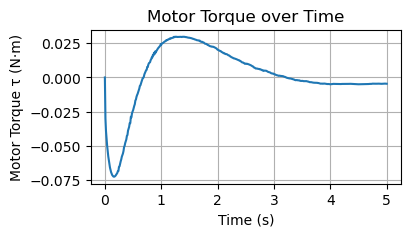

In [332]:
plt.figure(figsize=(4, 2))
plt.plot(t_eval, tau_log)
plt.xlabel("Time (s)")
plt.ylabel("Motor Torque τ (N·m)")
plt.title("Motor Torque over Time")
plt.grid(True)
plt.show()

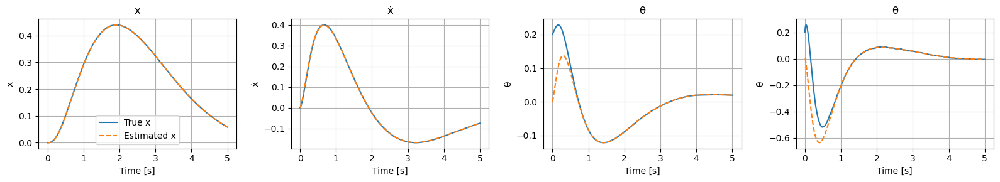

In [333]:
labels = ['x', 'ẋ', 'θ', 'θ̇']
t = sol.t

fig, axes = plt.subplots(1, 4, figsize=(16, 3))

for i in range(4):
    ax = axes[i]
    ax.plot(t, x_hist[i], label=f'True {labels[i]}')
    ax.plot(t, xhat_hist[i], '--', label=f'Estimated {labels[i]}')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel(labels[i])
    ax.set_title(f'{labels[i]}')
    ax.grid(True)
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()


In [334]:
# animate_inverted_pendulum(x_hist[0], x_hist[2], time = sol.t)

## Continuous Simulation

In [335]:
def lqg_closed_loop_continuous(t, z, A, B, C, K, L, disturbances):
    x = z[:4]
    x_hat = z[4:]

    u = -K @ x_hat
    u = np.clip(u, -10, 10)

    y = C @ x


    D = np.random.normal(loc=0.0, scale=np.array([
        0.001,  # (1 mm)
        0.01,   # (1 cm/s)
        0.01,   # (0.01 rad)
        0.1     # (0.1 rad/s)
    ]))


    for disturb in disturbances:
        if abs(t - disturb['time']) < dt / 2:
            D[disturb['index']] += disturb['value']

    dx = A @ x + B @ u + D
    dx_hat = A @ x_hat + B @ u + L @ (y - C @ x_hat)

    dz = np.concatenate([dx, dx_hat])
    return dz


In [336]:
xhat0 = np.zeros(4)                     # Initial estimated state
z0 = np.concatenate([x0, xhat0])        # Combined initial state

dt = 0.01
T_total = 10
t_eval = np.arange(0, T_total + dt, dt)

disturbances = [
    {'time': 1.0, 'index': 1, 'value': 5},  # cart velocity
    {'time': 3.0, 'index': 3, 'value': 5}   # pendulum angular velocity 
]

sol = solve_ivp(
    fun=lambda t, z: lqg_closed_loop_continuous(t, z, sys.A, sys.B, sys.C, K, L, disturbances),
    t_span=(0, T_total),
    y0=z0,
    t_eval=t_eval
)

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]
tau_log = (-K @ xhat_hist).flatten()


In [337]:
tau_log.size

1001

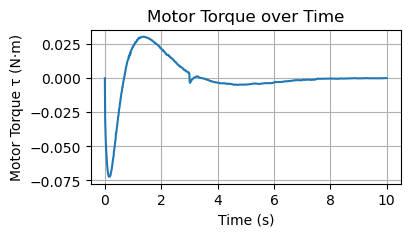

In [338]:
plt.figure(figsize=(4, 2))
plt.plot(t_eval, tau_log)
plt.xlabel("Time (s)")
plt.ylabel("Motor Torque τ (N·m)")
plt.title("Motor Torque over Time")
plt.grid(True)
plt.show()

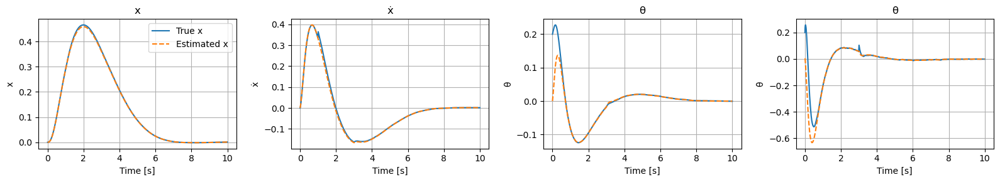

In [339]:
labels = ['x', 'ẋ', 'θ', 'θ̇']
t = sol.t

fig, axes = plt.subplots(1, 4, figsize=(16, 3))

for i in range(4):
    ax = axes[i]
    ax.plot(t, x_hist[i], label=f'True {labels[i]}')
    ax.plot(t, xhat_hist[i], '--', label=f'Estimated {labels[i]}')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel(labels[i])
    ax.set_title(f'{labels[i]}')
    ax.grid(True)
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()

In [340]:
# animate_inverted_pendulum(x_hist[0], x_hist[2], time = sol.t)

In [341]:
A_cl = np.block([
    [sys.A - sys.B @ K,       sys.B @ K],
    [L @ sys.C,     sys.A - L @ sys.C - sys.B @ K]
])

eigvals = np.linalg.eigvals(A_cl)
print(np.max(np.real(eigvals))) 

6.084395022712093


In [342]:
print(sys.A)

[[ 0.          1.          0.          0.        ]
 [ 0.          0.         -0.81670402  0.        ]
 [ 0.          0.          0.          1.        ]
 [ 0.          0.         31.35299342  0.        ]]


In [343]:
print(sys.B)

[[  0.        ]
 [-16.80450252]
 [  0.        ]
 [139.14876601]]


## Simulation in Non-Linear System

In [344]:
t = sp.symbols('t')
x = sp.symbols('x')
dx = sp.Derivative(sp.Function('x')(t), t)
theta_func = sp.Function('theta')(t)
theta = theta_func
dtheta = sp.Derivative(theta_func, t)
tau = sp.symbols('tau')

params = {
    'Mb': 0.366,
    'rb': 0.09,
    'Ib': 0.0082,
    'Mw': 0.409 * 2,
    'Iw': 0.00029,
    'r': 0.06,
    'g': 9.81
}

param_subs = {
    sp.symbols('M_b'): params['Mb'],
    sp.symbols('M_w'): params['Mw'],
    sp.symbols('I_b'): params['Ib'],
    sp.symbols('I_w'): params['Iw'],
    sp.symbols('r'): params['r'],
    sp.symbols('r_b'): params['rb'],
    sp.symbols('g'): params['g'],
}

In [345]:
with open('../dynamics/output/xdd_solution.txt', 'r') as f:
    xdd_solution = parse_expr(f.read())

with open('../dynamics/output/thetadd_solution.txt', 'r') as f:
    thetadd_solution = parse_expr(f.read())

xdd_partial = xdd_solution.subs(param_subs)
thetadd_partial = thetadd_solution.subs(param_subs)

In [346]:
# Define max torque limit
max_tau = 1.0 

In [347]:
def nonlinear_dynamics(t, x, K, max_tau,disturbance_func=None,measurement_noise_func=None):
    pos, vel, theta, dtheta = x
    # Measurement noise
    if measurement_noise_func is not None:
        pos_meas = pos + measurement_noise_func['pos'](t)
        vel_meas = vel + measurement_noise_func['vel'](t)
        theta_meas = theta + measurement_noise_func['theta'](t)
        dtheta_meas = dtheta + measurement_noise_func['dtheta'](t)
    else:
        pos_meas, vel_meas, theta_meas, dtheta_meas = pos, vel, theta, dtheta

    state_vector = np.array([pos_meas, vel_meas, theta_meas, dtheta_meas])
    tau_value = float((-K @ state_vector).item())
    tau_value = np.clip(tau_value, -max_tau, max_tau)

    # External disturbance torque
    disturbance_tau = 0.0
    if disturbance_func is not None:
        disturbance_tau = disturbance_func(t)
    tau_total = tau_value + disturbance_tau

    live_subs = {
        sp.symbols('x'): pos,
        sp.Derivative(sp.Function('x')(sp.symbols('t')), sp.symbols('t')): vel,
        sp.Function('theta')(sp.symbols('t')): theta,
        sp.Derivative(sp.Function('theta')(sp.symbols('t')), sp.symbols('t')): dtheta,
        sp.symbols('tau'): float(tau_total),
    }

    x_ddot = float(xdd_partial.evalf(subs=live_subs))
    theta_ddot = float(thetadd_partial.evalf(subs=live_subs))

    return [vel, x_ddot, dtheta, theta_ddot]


In [348]:
T_total = 15 
dt = 0.01
t_eval = np.arange(0, T_total + dt, dt)

noise_time = t_eval
noise_values = np.random.normal(0, 0.25, size=len(noise_time))
disturbance_func = interp1d(noise_time, noise_values, kind='linear', fill_value='extrapolate')

measurement_noise = {
    'pos': np.random.normal(0, 0.01, size=len(t_eval)),
    'vel': np.random.normal(0, 0.01, size=len(t_eval)),
    'theta': np.random.normal(0, 0.001, size=len(t_eval)),
    'dtheta': np.random.normal(0, 0.01, size=len(t_eval)),
}

measurement_noise_func = {
    key: interp1d(t_eval, noise, kind='linear', fill_value='extrapolate')
    for key, noise in measurement_noise.items()
}


sol_nonlinear = solve_ivp(
    fun=lambda t, x: nonlinear_dynamics(t, x, K, max_tau,
                                        disturbance_func=disturbance_func,
                                        measurement_noise_func=measurement_noise_func),
    t_span=(0, T_total),
    y0=x0,
    t_eval=t_eval
)

x_pos = sol_nonlinear.y[0]
x_vel = sol_nonlinear.y[1]
theta = sol_nonlinear.y[2]
dtheta = sol_nonlinear.y[3]
time = sol_nonlinear.t

In [349]:
tau_log = []
for xi in sol_nonlinear.y.T:
    pos, vel, theta_val, dtheta_val = xi
    state_vector = np.array([pos, vel, theta_val, dtheta_val])
    tau_value = float((-K @ state_vector).item())
    tau_value = np.clip(tau_value, -max_tau, max_tau)
    tau_log.append(tau_value)

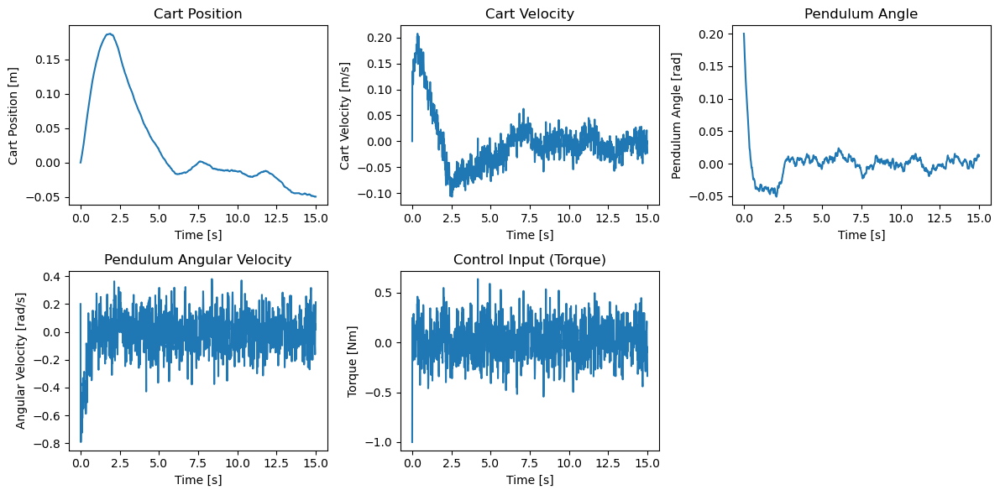

In [350]:
plt.figure(figsize=(12, 6))

# First row
plt.subplot(2, 3, 1)
plt.plot(time, x_pos)
plt.xlabel('Time [s]')
plt.ylabel('Cart Position [m]')
plt.title('Cart Position')

plt.subplot(2, 3, 2)
plt.plot(time, x_vel)
plt.xlabel('Time [s]')
plt.ylabel('Cart Velocity [m/s]')
plt.title('Cart Velocity')

plt.subplot(2, 3, 3)
plt.plot(time, theta)
plt.xlabel('Time [s]')
plt.ylabel('Pendulum Angle [rad]')
plt.title('Pendulum Angle')

# Second row
plt.subplot(2, 3, 4)
plt.plot(time, dtheta)
plt.xlabel('Time [s]')
plt.ylabel('Angular Velocity [rad/s]')
plt.title('Pendulum Angular Velocity')

plt.subplot(2, 3, 5)
plt.plot(time, tau_log)
plt.xlabel('Time [s]')
plt.ylabel('Torque [Nm]')
plt.title('Control Input (Torque)')

plt.tight_layout()
plt.show()


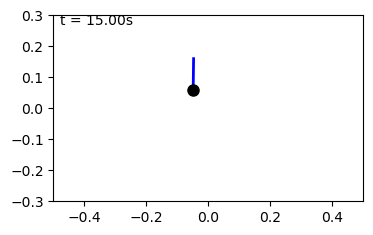

In [351]:
animate_inverted_pendulum(x_pos = x_pos, theta=theta , time = sol_nonlinear.t)